# Load Packages

In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import os
import sys
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, RandomizedSearchCV, train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from tqdm import tqdm
import statsmodels.api as sm
from pandas.testing import assert_frame_equal
import math

parent_dir = os.path.abspath('..')
sys.path.insert(0, parent_dir)

from src.preprocessing import PreprocessData
from src.integer_programming import optimise_team
from src.player_stats import PlayerStats
from src.player_stats import TeamStats
from src.player_stats import CombineTeamAndPlayers
from src.individual_player_models import Modelling

### Preprocessing Notes

While the data contains several variables already, there are many potential new variables to add such as:
- Opponent team's finishing position in previous season.
- Rolling average of teams position over last 5 games
- Rolling average of opponent teams position over last 5 games
- Current difference in league position between teams
- Add in a rolling total of the teams points and compare it to the opponents team (likely percentage wise difference)
- Column with the number of minutes played in the past 7 days (will need domestic cup/european/international data)


Initally when taking the previous x games, we're taking the previous x games the PLAYER was involved in.  This shouldn't be a problem most of the time, however could create a couple of issues should the player transfer teams. Ways to deal with this looking at their new teams form can be explored down the line.


Updates to TeamStats required:

Works fine if all 20 teams play in a gw, however if less play then it just ranks those that do play. And if there are doubles, then it needs to take the most recent (i.e. later gw) match.  

In [2]:
# loaded_data = PreprocessData('../data/2020-21/teams.csv', 
#                       '../data/2021-22/teams.csv', 
#                       '../data/2022-23/teams.csv', 
#                       '../data/2020-21/gws/merged_gw.csv', 
#                       '../data/2021-22/gws/merged_gw.csv', 
#                       '../data/2022-23/gws/merged_gw.csv')

# team_form = 5
# preprocessed_data = loaded_data.get_preprocessed_data()

# player_stats = PlayerStats(preprocessed_data)
# players_df = player_stats.process_data(team_form)

# team_stats = TeamStats(players_df)
# team_df = team_stats.calculate_team_df(team_form)

# combine_team_and_player = CombineTeamAndPlayers(players_df, team_df, team_form)
# final_df = combine_team_and_player.combine()

In [3]:
final_df = pd.read_csv("../data/processed_data/complete_df.csv")
played = final_df[final_df['minutes_player']>0]

## EDA

In [4]:
# Creating df specific for each season
season2223 = played[played["season"]=="2022-23"]
season2122 = played[played["season"]=="2021-22"]
season2021 = played[played["season"]=="2020-21"]

# Creating df specific for each position
gks = played[played["position_player"]=="GK"]
defs = played[played["position_player"]=="DEF"]
mids = played[played["position_player"]=="MID"]
fwds = played[played["position_player"]=="FWD"]

#### Summary

In [5]:
def summarise_position(position, position_str):
    print(f"In total, there have been {len(position)} different {position_str} that have played across the 3 seasons being analysed.")
    print(f"""Across the 3 seasons there were at total of 1140 games played. With 2 teams in each match, this means that on average each team played
{round(len(position)/2280,3)} {position_str} per match.""")

def discipline_summary(df, position_str):
    red_cards = df["red_cards_player"].sum()
    yellow_cards = df["yellow_cards_player"].sum()

    minutes_played = df["minutes_player"].sum()
    minutes_per_yellow = yellow_cards/minutes_played
    minutes_per_red = red_cards/minutes_played

    yellow_per_match = minutes_per_yellow * 90
    red_per_match = minutes_per_red * 90

    captital_str = position_str.capitalize()

    # top_5_yellow_per_minute = 
    # top_5_red_per_minute = 

    print(f"""{captital_str} have received on average {yellow_per_match} yellow cards and {red_per_match} red cards every match.""")
    print(f"""That equates to {position_str} that play receiving a yellow card every {1/yellow_per_match} matches and a red card every {1/red_per_match} matches. \n""")

In [6]:
summarise_position(gks, 'goalkeepers')
discipline_summary(gks, 'goalkeepers')

summarise_position(defs, 'defenders')
discipline_summary(defs, 'defenders')

summarise_position(mids, 'midfielders')
discipline_summary(mids, 'midfielders')

summarise_position(fwds, 'strikers')
discipline_summary(fwds, 'strikers')


In total, there have been 2298 different goalkeepers that have played across the 3 seasons being analysed.
Across the 3 seasons there were at total of 1140 games played. With 2 teams in each match, this means that on average each team played
1.008 goalkeepers per match.
Goalkeepers have received on average 0.05044105463229202 yellow cards and 0.00131585359910327 red cards every match.
That equates to goalkeepers that play receiving a yellow card every 19.82512077294686 matches and a red card every 759.9629629629629 matches. 

In total, there have been 10834 different defenders that have played across the 3 seasons being analysed.
Across the 3 seasons there were at total of 1140 games played. With 2 teams in each match, this means that on average each team played
4.752 defenders per match.
Defenders have received on average 0.1628976619394404 yellow cards and 0.006707550785741664 red cards every match.
That equates to defenders that play receiving a yellow card every 6.138823529411765 m

In [7]:
def position_points_distribution(df,hist_bins = 20):
    fig = px.histogram(df, 
                   x='total_points_player',
                   nbins=15, 
                   histnorm="percent",
                   facet_row='position_player',
                   color = 'position_player',
                   labels={'total_points_player': 'Total Points'}
)
    # Update subplot titles and axis labels
    fig.update_yaxes(title_text='', showticklabels=True, showline=False)
    fig.update_yaxes(matches='y')
    fig.update_layout(height=650, title = 'Points Distribution by Position')

    fig.show()

    sns.kdeplot(data=df, x='total_points_player', hue='position_player')

    fig3 = px.density_contour(df, x='total_points_player', y='position_player',
                         histnorm='probability density', color='position_player',
                         labels={'total_points_player': 'Total Points', 'position_player': 'Position'},
                         title='KDE Plot of Total Points by Position')

    # Update the layout
    fig3.update_layout(
        xaxis=dict(title="Total Points"),
        yaxis=dict(title="Position"),
        showlegend=True,
    )
    # Show the plot
    fig3.show()

    fig4 = px.box(df,
                   y = 'total_points_player',
                   color = 'position_player')
    fig4.show()

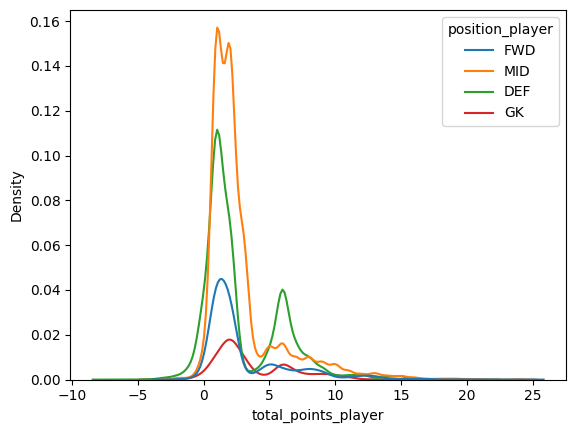

In [8]:
position_points_distribution(played)

Midfielders and stikers are known to be the highest scoring players in fpl but these plots don't seem to back this up. We'll now filter the players to only show those who have scored over 5 points on 5 occasions across a season as these are likely to be the players that are chosen from for a squad.

In [9]:
def higher_points_df(df, points_required, game_numbers):
    """
    Filters the dataframe to return players scoring 4 or more points at 5 or more stages across a season.
     Args:
        df (pandas.DataFrame): A DataFrame containing all player's matches across each season.
         
    Returns:
        pandas.DataFrame: A filtered DataFrame only showing players who scored 4 points on 5 across 5 or more points across a season.
    """
    df_copy = df.copy()
    df = df.copy()
    df = df[df["total_points_player"]>=points_required].groupby(['name_player', 'season']).size().reset_index(name='count')
    df = df[df['count']>=game_numbers]
    df = pd.merge(df_copy, df[['name_player', 'season']], on=['name_player', 'season'], how='inner')
    return df

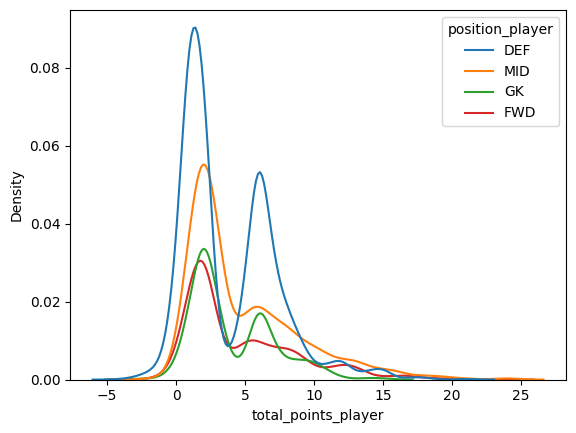

In [10]:
higher_points_played = higher_points_df(played, 5, 11)
position_points_distribution(higher_points_played)

In [11]:
def summary_figures_by_position(df):
    df = df.copy()
    df = df[['position_player', 'total_points_player']]
    position_summary = df.groupby('position_player').agg([
        ('mean', lambda x: round(x.mean(), 2)),
        ('median', 'median'),
        ('min', 'min'),
        ('max', 'max'),
        ('lower_quartile', lambda x: x.quantile(0.25)),
        ('upper_quartile', lambda x: x.quantile(0.75)),
        ])['total_points_player']
    return position_summary

summary_figures_by_position(higher_points_played)

,mean,median,min,max,lower_quartile,upper_quartile
position_player,,,,,,
DEF,3.84,2.0,-4,21,1.0,6.0
FWD,4.61,2.0,-2,23,2.0,7.0
GK,4.00,3.0,-3,15,2.0,6.0
MID,4.81,3.0,-2,24,2.0,7.0


### Which Players Are 'Higher Points' Players

For 2022/23 season, we can see the higher points players below for each position along with their various averages across the season.

In [12]:
def players_by_position(df, season, position):
    df = df.copy()
    df = df[df['season'] ==  season]
    df = df[df['position_player'] == position]
    columns_to_drop = ['fixture_player', 
                       'ict_index_player', 
                       'bps_player', 
                       'own_goals_player', 
                       'penalties_missed_player', 
                       'penalties_saved_player', 
                       'season_goal_difference_opp_team', 
                       'season_matches_played_opp_team', 
                       'season_goals_against_per_match_opp_team', 
                       'total_points_season_opp_team',
                       'total_goals_season_opp_team',
                       'total_goals_against_season_opp_team',
                       'player_season_fixture_number',
                       'season_points_per_match_opp_team',
                       'season_goal_difference_per_match_opp_team',
                       'season_goals_per_match_opp_team',
                       'last_5_team_against_opp_team',
                       'last_5_team_goals_opp_team',
                       'last_5_team_match_points_opp_team',
                       'total_goals_season_player_team',
                       'total_goals_against_season_player_team',
                       'total_points_season_player_team',
                       'season_goal_difference_player_team',
                       'season_matches_played_player_team',
                       'season_goal_difference_per_match_player_team',
                       'last_5_player_goals',
                       'last_5_games_points_player',
                       'last_5_ind_assists_ratio_player',
                       'last_5_team_goals',
                       'last_5_team_against',
                       'last_5_team_match_points',
                       'transfers_out_player',
                       'transfers_in_player',
                       'transfers_balance_player',
                       'selected_player',
                       'was_home_player',
                       'last_5_ind_goals_ratio_player'
    ]

    df = df.drop(columns = columns_to_drop)

    agregations = {
        'assists_player':'mean',
        'bonus_player': 'mean',
        'clean_sheets_player':'mean',
        'creativity_player':'mean',
        'goals_conceded_player': 'mean',
        'goals_scored_player':'mean',
        'influence_player':'mean',
        'minutes_player':'sum',
        'red_cards_player':'sum',
        'saves_player':'mean',
        'threat_player':'mean',
        'total_points_player':'mean',
        'value_player':'mean',
        'yellow_cards_player':'sum',
        'team_season_goals_scored':'sum',
        'team_season_goals_against':'sum',
        'season_goals_per_match_player_team':'max',
        'season_goals_against_per_match_player_team':'max',
        'season_points_per_match_player_team':'mean'
        }

    df = df.groupby('name_player').agg(agregations)

    df['player_points_per_team_goal'] = df['total_points_player']/df['season_points_per_match_player_team']
    df['points_per_price_ratio'] = df['total_points_player'] / df['value_player'] *100

    df = df.sort_values(by = 'points_per_price_ratio', ascending = False)

    return df

In [13]:
players_by_position(higher_points_played, '2022-23', 'GK')

,assists_player,bonus_player,clean_sheets_player,creativity_player,goals_conceded_player,goals_scored_player,influence_player,minutes_player,red_cards_player,saves_player,...,total_points_player,value_player,yellow_cards_player,team_season_goals_scored,team_season_goals_against,season_goals_per_match_player_team,season_goals_against_per_match_player_team,season_points_per_match_player_team,player_points_per_team_goal,points_per_price_ratio
name_player,,,,,,,,,,,,,,,,,,,,,
David Raya Martin,0.000000,0.526316,0.315789,0.528947,1.210526,0.0,29.615789,3420,0,4.052632,...,4.368421,46.789474,1,58,46,3.000000,2.000000,1.399686,3.121001,9.336333
David De Gea Quintana,0.000000,0.131579,0.447368,0.342105,1.131579,0.0,18.610526,3420,0,2.657895,...,4.236842,49.605263,0,58,43,1.708333,3.000000,1.777878,2.383089,8.541114
José Malheiro de Sá,0.000000,0.500000,0.305556,0.000000,1.527778,0.0,23.488889,3240,0,3.000000,...,4.111111,50.138889,2,30,55,1.000000,2.000000,0.837709,4.907563,8.199446
Alisson Ramses Becker,0.027027,0.405405,0.378378,0.272973,1.162162,0.0,26.118919,3330,0,2.891892,...,4.378378,54.297297,1,71,43,3.250000,2.000000,1.509278,2.900975,8.063713
Nick Pope,0.000000,0.378378,0.378378,0.540541,0.864865,0.0,18.589189,3261,1,2.351351,...,4.243243,53.081081,3,67,32,2.000000,1.200000,1.810443,2.343760,7.993890
Aaron Ramsdale,0.000000,0.236842,0.368421,0.000000,1.131579,0.0,20.036842,3420,0,2.473684,...,3.763158,49.026316,1,88,43,3.000000,1.166667,2.547466,1.477216,7.675792
Emiliano Martínez Romero,0.000000,0.416667,0.305556,0.277778,1.055556,0.0,22.311111,3139,0,2.722222,...,3.750000,49.361111,7,48,43,1.419355,2.000000,1.208701,3.102504,7.597074
Lukasz Fabianski,0.000000,0.277778,0.250000,0.000000,1.333333,0.0,20.988889,3111,0,3.027778,...,3.527778,49.666667,1,41,50,1.108108,2.000000,0.861587,4.094513,7.102908
Ederson Santana de Moraes,0.028571,0.228571,0.314286,0.374286,0.914286,0.0,13.685714,3150,0,1.314286,...,3.457143,54.285714,3,89,32,3.800000,1.250000,2.372468,1.457192,6.368421


In [14]:
players_by_position(higher_points_played, '2022-23', 'DEF')

,assists_player,bonus_player,clean_sheets_player,creativity_player,goals_conceded_player,goals_scored_player,influence_player,minutes_player,red_cards_player,saves_player,...,total_points_player,value_player,yellow_cards_player,team_season_goals_scored,team_season_goals_against,season_goals_per_match_player_team,season_goals_against_per_match_player_team,season_points_per_match_player_team,player_points_per_team_goal,points_per_price_ratio
name_player,,,,,,,,,,,,,,,,,,,,,
Kieran Trippier,0.236842,1.026316,0.421053,47.426316,0.815789,0.026316,23.442105,3342,0,0.0,...,5.210526,58.078947,5,68,33,2.000000,1.200000,1.812644,2.874545,8.971454
Benjamin White,0.131579,0.315789,0.394737,12.926316,0.921053,0.052632,17.078947,3054,0,0.0,...,4.105263,46.973684,5,88,43,3.000000,1.166667,2.547466,1.611509,8.739496
William Saliba,0.037037,0.518519,0.444444,3.733333,0.925926,0.074074,19.592593,2415,0,0.0,...,4.333333,50.777778,4,62,25,3.000000,1.166667,2.630010,1.647649,8.533917
Diogo Dalot Teixeira,0.076923,0.730769,0.384615,15.950000,1.307692,0.038462,17.515385,2152,0,0.0,...,3.923077,46.192308,6,36,35,1.708333,3.000000,1.707895,2.297024,8.492923
Ethan Pinnock,0.000000,0.200000,0.333333,3.496667,1.133333,0.100000,25.053333,2700,0,0.0,...,3.733333,44.000000,0,43,34,1.875000,1.888889,1.407311,2.652813,8.484848
Tyrone Mings,0.085714,0.485714,0.342857,2.502857,1.142857,0.028571,18.194286,3150,0,0.0,...,3.714286,44.142857,7,50,40,1.419355,2.000000,1.208463,3.073561,8.414239
Ben Mee,0.054054,0.297297,0.324324,2.486486,1.081081,0.081081,20.578378,3269,0,0.0,...,3.864865,47.783784,2,58,42,3.000000,2.000000,1.403213,2.754297,8.088235
Sven Botman,0.055556,0.222222,0.361111,3.336111,0.833333,0.000000,14.894444,3127,0,0.0,...,3.583333,44.666667,2,66,30,2.000000,1.200000,1.840033,1.947429,8.022388
Luke Shaw,0.129032,0.645161,0.387097,16.000000,1.129032,0.032258,17.000000,2552,0,0.0,...,4.000000,50.387097,8,45,40,1.708333,2.000000,1.857055,2.153948,7.938540


In [15]:
players_by_position(higher_points_played, '2022-23', 'MID')

,assists_player,bonus_player,clean_sheets_player,creativity_player,goals_conceded_player,goals_scored_player,influence_player,minutes_player,red_cards_player,saves_player,...,total_points_player,value_player,yellow_cards_player,team_season_goals_scored,team_season_goals_against,season_goals_per_match_player_team,season_goals_against_per_match_player_team,season_points_per_match_player_team,player_points_per_team_goal,points_per_price_ratio
name_player,,,,,,,,,,,,,,,,,,,,,
Solly March,0.303030,0.484848,0.303030,29.154545,1.212121,0.181818,23.806061,2719,0,0.0,...,4.454545,50.848485,2,63,45,2.000000,1.500000,1.767676,2.520001,8.760429
Miguel Almirón Rejala,0.117647,0.441176,0.441176,11.664706,0.647059,0.323529,17.341176,2487,0,0.0,...,4.647059,54.058824,2,57,30,2.000000,1.200000,1.810770,2.566343,8.596300
Martin Ødegaard,0.216216,0.810811,0.351351,29.740541,1.027027,0.405405,25.945946,3132,0,0.0,...,5.729730,66.729730,4,85,43,3.000000,1.166667,2.548785,2.248024,8.586472
Marcus Rashford,0.200000,0.600000,0.371429,12.585714,1.114286,0.485714,23.280000,2880,0,0.0,...,5.857143,68.914286,2,53,43,1.708333,3.000000,1.767084,3.314581,8.499171
Granit Xhaka,0.216216,0.405405,0.351351,18.197297,0.945946,0.189189,17.486486,2992,0,0.0,...,4.135135,49.675676,4,85,40,3.000000,1.166667,2.551921,1.620401,8.324266
Gabriel Martinelli Silva,0.250000,0.500000,0.388889,23.280556,0.916667,0.416667,23.450000,2789,0,0.0,...,5.500000,66.138889,3,83,42,3.000000,1.166667,2.566202,2.143246,8.315834
Andreas Hoelgebaum Pereira,0.303030,0.272727,0.242424,28.703030,1.212121,0.121212,13.212121,2696,0,0.0,...,3.727273,45.000000,8,45,45,2.000000,2.000000,1.413861,2.636237,8.282828
Douglas Luiz Soares de Paulo,0.189189,0.459459,0.351351,17.408108,0.945946,0.162162,17.313514,2922,1,0.0,...,3.837838,48.081081,6,49,45,1.419355,2.000000,1.239710,3.095756,7.982012
Kaoru Mitoma,0.272727,0.333333,0.242424,17.200000,1.060606,0.212121,17.175758,2311,0,0.0,...,4.181818,52.878788,0,63,45,2.000000,1.500000,1.762143,2.373144,7.908309


In [16]:
players_by_position(higher_points_played, '2022-23', 'FWD')

,assists_player,bonus_player,clean_sheets_player,creativity_player,goals_conceded_player,goals_scored_player,influence_player,minutes_player,red_cards_player,saves_player,...,total_points_player,value_player,yellow_cards_player,team_season_goals_scored,team_season_goals_against,season_goals_per_match_player_team,season_goals_against_per_match_player_team,season_points_per_match_player_team,player_points_per_team_goal,points_per_price_ratio
name_player,,,,,,,,,,,,,,,,,,,,,
Ivan Toney,0.121212,1.060606,0.303030,12.857576,1.272727,0.606061,28.084848,2953,0,0.0,...,5.515152,74.878788,9,47,42,3.000000,2.000000,1.402103,3.933486,7.365439
Callum Wilson,0.193548,0.645161,0.322581,8.719355,0.516129,0.580645,21.019355,1870,0,0.0,...,5.064516,71.580645,4,59,27,2.000000,1.000000,1.862324,2.719460,7.075259
Dominic Solanke,0.303030,0.424242,0.242424,7.842424,1.575758,0.181818,15.309091,2865,0,0.0,...,3.939394,56.575758,2,36,60,1.200000,4.000000,1.008148,3.907557,6.963042
Bryan Mbeumo,0.236842,0.500000,0.263158,20.165789,1.026316,0.236842,17.431579,2905,0,0.0,...,3.947368,58.500000,5,58,46,3.000000,2.000000,1.399686,2.820181,6.747638
Aleksandar Mitrović,0.083333,0.583333,0.291667,9.020833,1.250000,0.583333,24.366667,2010,0,0.0,...,4.458333,68.000000,7,36,32,2.000000,2.000000,1.403058,3.177584,6.556373
Ollie Watkins,0.216216,0.675676,0.351351,11.040541,1.081081,0.405405,21.405405,3129,0,0.0,...,4.729730,73.216216,4,49,45,1.419355,2.000000,1.209948,3.909037,6.459948
Erling Haaland,0.257143,1.142857,0.371429,10.600000,0.742857,1.028571,39.714286,2767,0,0.0,...,7.771429,121.371429,5,89,31,3.800000,1.250000,2.376704,3.269835,6.403013
Harry Kane,0.236842,1.263158,0.289474,17.915789,1.631579,0.789474,32.157895,3406,0,0.0,...,6.921053,115.578947,6,70,63,4.000000,1.676471,1.916902,3.610540,5.988160
Gabriel Fernando de Jesus,0.269231,0.653846,0.346154,15.665385,0.884615,0.423077,22.853846,2064,0,0.0,...,4.807692,80.576923,6,62,29,3.000000,1.166667,2.564253,1.874890,5.966587


### Correlation Between Players

One of the interesting things to explore could be how players are correlated with each other in terms of their scoring. This has potential benefits such as:
- If we know two players points are more correlated than others, could some kind of unsupervised learning could be used to group players. This could then mean players from different groups are chosen to mitigate risk. Or alternatively players from similar groups could be taken to maximise risk and therefore increase the chance of high returns.
- We could then explore if their are optimal times to deploy a high/low risk stategy.
- If we can see points are negatively correlated, if someone if injured/suspended, will players suddenly pick up their points scoring total with a certain name missing? This could bring potential differential benefits?

We can also explore how:
- Players points correlate to their teams points for the season
- Points for defenders correlate to defensive record of a team
- Points for forwards correlate to attacking record of a team
- How points of defenders in a team correspond to those of attackers in their team

This has been made into a py file and tested on a streamlit dashboard.

### Name Similarity

It was noticed when reviewing the data on a streamlit that the names of some players change between seasons, furthermore, some players are not known as their commonly referred to name. For example, Bruno Fernandes, as he is commonly known, is sometimes referred to as 'Bruno Miguel Borges Fernandes' and sometimes 'Bruno Borges Fernandes'. We'll now look to tidy this up so they're consistently referred to as they commonly known name. 

In [17]:
# string_mapping = {
#     'Benjamin Chilwell' : 'Ben Chilwell',
#     'Bernardo Fernandes Da Silva Junior':'Bernardo Fernandes da Silva Junior',
#     'Bernardo Mota Veiga de Carvalho e Silva':'Bernardo Veiga de Carvalho e Silva',
#     'Björn Engels':'Bjorn Engels',
#     'Bobby Decordova-Reid':'Bobby De Cordova-Reid',
#     'Bruno André Cavaco Jordão':'Bruno André Cavaco Jordao',
#     'Bruno Miguel Borges Fernandes':'Bruno Borges Fernandes',
#     'Carlos Vinícius Alves Morais':'Carlos Vinicius Alves Morais',
#     'José Diogo Dalot Teixeira':'Diogo Dalot Teixeira',
#     'Emerson Aparecido Leite de Souza Junior':'Emerson Leite de Souza Junior',
#     'Emiliano Martínez':'Emiliano Martínez Romero',
#     'Gabriel Teodoro Martinelli Silva':'Gabriel Martinelli Silva',
#     'Junior Firpo Adames':'Héctor Junior Firpo Adames',
#     'Ivan Neves Abreu Cavaleiro':'Ivan Ricardo Neves Abreu Cavaleiro',
#     'Joseph Willock':'Joe Willock',
#     'Joshua Wilson-Esbrand':'Josh Wilson-Esbrand',
#     'Lyanco Silveira Neves Vojnovic':'Lyanco Evangelista Silveira Neves Vojnovic',
#     'Matija Šarkić':'Matija Šarkic',
#     'Matija Šarkic':'Matija Sarkic',
#     'André Filipe Tavares Gomes':'André Tavares Gomes',
#     'Mattéo Guendouzi':'Matteo Guendouzi',  
#     'Mbwana Samatta':'Mbwana Ally Samatta',
#     'Willian Borges Da Silva':'Willian Borges da Silva',
#     'William Smallbone' : 'Will Smallbone',
#     'Thomas McGill':'Tom McGill',
#     'Rúben Santos Gato Alves Dias':'Rúben Gato Alves Dias',
#     'Roméo Lavia':'Romeo Lavia',
#     'Rúben da Silva Neves':'Rúben Diogo da Silva Neves',
#     'Rayan Ait Nouri':'Rayan Aït-Nouri',
#     'Ricardo Barbosa Pereira':'Ricardo Domingos Barbosa Pereira',
#     'Finley Stevens':'Fin Stevens',
#     'Matt Clarke':'Matthew Clarke'
    
# }

# final_df['name_player'] = final_df['name_player'].replace(string_mapping)

In [18]:
alphabetical_by_player_name = final_df.sort_values(by='name_player')
player_names = alphabetical_by_player_name['name_player'].unique()
player_names

array(['Aaron Connolly', 'Aaron Cresswell', 'Aaron Hickey', ...,
       'Álvaro Fernández', 'Çaglar Söyüncü', 'Ørjan Nyland'], dtype=object)

In [19]:
# from fuzzywuzzy import fuzz

# close_matches = []

# for i in range(len(player_names)-1):
#     for j in range(i+1, len(player_names)-1):
#         match_ratio = fuzz.ratio(player_names[i], player_names[j])
#         if match_ratio >82:
#             close_matches.append(player_names[i])
#             close_matches.append(player_names[j])

# len(close_matches)

EXPLORE WHETHER ITS BEST TO HEDGE BETS WITH MULTIPLE TEAMS AT START OF SEASON

### Starting Season

What is the best way to start an FPL season.  Here, we'll look at:
-  How the 'best team' from the season scores for the first 3 games of the new season. 
- How do minutes played vary from season to season for the higher scorers? 
- Does spreading risk between teams work better? 
- Is it best to spread defenders between teams?

We'll first run the new costs and last seasons scoring through the integer_programming 'optimise_team' function to see an the optimal team in theory.

In [20]:
from src.integer_programming import optimise_team
data_2324 = pd.read_csv("../data/2023-24/cleaned_players.csv")
data_2324.head()

,first_name,second_name,goals_scored,assists,total_points,minutes,goals_conceded,creativity,influence,threat,bonus,bps,ict_index,clean_sheets,red_cards,yellow_cards,selected_by_percent,now_cost,element_type
0,Folarin,Balogun,0,0,0,0,0,0.0,0.0,0.0,0,0,0.0,0,0,0,1.4,45,FWD
1,Cédric,Alves Soares,0,0,10,223,3,51.4,56.4,10.0,0,56,11.9,0,0,0,0.4,40,DEF
2,Mohamed,Elneny,0,0,6,111,2,5.4,4.6,0.0,0,27,1.1,0,0,0,0.2,45,MID
3,Fábio,Ferreira Vieira,1,2,40,500,5,180.6,116.0,123.0,2,134,41.5,2,0,0,0.1,55,MID
4,Gabriel,dos Santos Magalhães,3,0,146,3409,43,131.4,743.8,401.0,15,723,127.7,14,0,5,20.5,50,DEF


In [21]:
# data_2324 = pd.read_csv("../data/2023-24/cleaned_players.csv")
# data_2324 = data_2324[data_2324['second_name'] != 'Toney']
# data_2324 = data_2324[data_2324['second_name'] != 'White']
# data_2324 = data_2324[data_2324['second_name'] != 'Xhaka']
# data_2324 = data_2324[data_2324['second_name'] != 'Schär']
# data_2324 = data_2324[data_2324['second_name'] != 'Burn']
# data_2324 = data_2324[data_2324['second_name'] != 'Botman']

# team_opt = optimise_team(data_2324, 820, 4, 4, 2)
# print(team_opt['total_points'].sum())

def team_optimiser_customiser(data_path, 
                              players_to_exclude, 
                              budget, 
                              defenders, 
                              midfielders, 
                              forwards):
    df = pd.read_csv(data_path)

    for player in players_to_exclude:
        df = df[df['second_name'] != player]
    
    optimised_team = optimise_team(df, budget, defenders, midfielders, forwards)
    print(f"The team would have scored {optimised_team['total_points'].sum()}, exlcuding using a captain.")
    return optimised_team

excluded_players = ['Toney',
                    'Xhaka',
                    'Schär',
                    'Botman',
                    'Burn',
                    'Raya Martin',
                    'White',
                    'dos Santos Magalhães',
                    'Kane']

team_optimiser_customiser("../data/2023-24/cleaned_players.csv",
                          excluded_players,
                          825,
                          4,
                          4,
                          2,
                          )

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/charliepassfield/opt/anaconda3/envs/fantasyfpl/lib/python3.11/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/m8/cx2mc01s21v0mf9pzbj5b_bh0000gn/T/a76f18f5976f403faf2cae7c2330579c-pulp.mps max timeMode elapsed branch printingOptions all solution /var/folders/m8/cx2mc01s21v0mf9pzbj5b_bh0000gn/T/a76f18f5976f403faf2cae7c2330579c-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 10 COLUMNS
At line 2801 RHS
At line 2807 BOUNDS
At line 3409 ENDATA
Problem MODEL has 5 rows, 601 columns and 1202 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 2025 - 0.00 seconds
Cgl0003I 0 fixed, 3 tightened bounds, 0 strengthened rows, 0 substitutions
Cgl0004I processed model has 5 rows, 384 columns (384 integer (345 of which binary)) and 768 elements
Cutoff increment increased from 1e-05 to 0.9999
Cb

,first_name,second_name,goals_scored,assists,total_points,minutes,goals_conceded,creativity,influence,threat,...,bps,ict_index,clean_sheets,red_cards,yellow_cards,selected_by_percent,now_cost,element_type,is_selected,is_selected_solution
11,Gabriel,Martinelli Silva,15,9,198,2789,33,838.1,844.2,1300.0,...,648,298.1,14,0,3,12.9,80,MID,is_selected10,1.0
13,Martin,Ødegaard,15,8,212,3132,38,1140.3,971.8,934.0,...,813,304.9,13,0,4,20.0,85,MID,is_selected12,1.0
18,Bukayo,Saka,14,12,202,3183,42,1106.1,1014.2,1214.0,...,678,333.4,12,0,6,54.5,85,MID,is_selected17,1.0
53,Tyrone,Mings,1,3,130,3150,40,88.2,664.4,121.0,...,617,87.8,12,0,7,15.2,45,DEF,is_selected50,1.0
61,Ollie,Watkins,15,8,175,3129,40,420.3,837.6,1308.0,...,550,256.7,13,0,4,14.5,80,FWD,is_selected58,1.0
114,Ben,Mee,3,2,143,3269,40,103.1,780.6,336.0,...,643,122.2,12,0,2,7.4,50,DEF,is_selected111,1.0
136,Pervis,Estupiñán,1,7,128,2674,43,757.9,575.2,297.0,...,593,162.5,10,0,4,51.0,50,DEF,is_selected131,1.0
309,Alisson,Ramses Becker,0,1,162,3330,43,10.1,966.4,0.0,...,824,97.6,14,0,1,9.3,55,GK,is_selected304,1.0
379,Erling,Haaland,36,9,272,2767,26,371.0,1390.0,1825.0,...,1040,358.1,13,0,5,86.3,140,FWD,is_selected374,1.0
420,Marcus,Rashford,17,7,205,2880,39,462.5,892.2,1466.0,...,530,282.2,13,0,2,42.5,90,MID,is_selected415,1.0


### Clean Sheets

### Player Specific Model

- single player
- multiple high scoring players in the same position
- feature selection on all
- try various model (random forest, decision tree)
- Bayesian approach with probability

Worth noting for feature selection there are over 18000 combinations. Some features are fairly highly correlated (e.g. points of the team and goals scored, so dropping the points of the team might be worth dropping to see how that affects performance)

We'll begin with attempting to build a model for GK's as they're perhaps the most simple.

The above has created 'high scoring' dfs as the players that are likely to be selected are those that score a lot of points so building the model from those makes most sense.

Currently only columns with recent player form and recent/season form of the team are being used. Down the line it would be good to add in:
- Expected goals/assists
- Expected goals conceded
- Season influence, creativity and threat

### GKS

Firstly lets explore the distribution of points that goalkeepers achieve, how it relates to the quality of the opposition and how it relates to the teams/oppositions form.

In [103]:
fig = px.histogram(gks, x='total_points_player', histnorm='probability density', nbins=20)

# Show the plot
fig.show()

From the above we can see that 30% of the time a goalkeeper will score 2 points (likely just appearance points).  Then 12% of the time the player will score 6 points (likely appearance and clean sheet). Now we'll explore further how the points breakdown.

### Defenders

In [56]:
fig = px.histogram(dfs, x='total_points_player', histnorm='probability density', nbins=20)

# Show the plot
fig.show()

In [91]:
gk

,name_player,position_player,team_player,assists_player,bonus_player,bps_player,clean_sheets_player,creativity_player,fixture_player,goals_conceded_player,...,season_goal_difference_opp_team,season_matches_played_opp_team,last_5_team_match_points_opp_team,last_5_team_goals_opp_team,last_5_team_against_opp_team,season_goals_per_match_opp_team,season_goals_against_per_match_opp_team,season_goal_difference_per_match_opp_team,season_points_per_match_opp_team,player_season_fixture_number
20,Mathew Ryan,GK,Brighton,0,0,12,0,0.0,7,3,...,0,0,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,1
49,Mathew Ryan,GK,Brighton,0,0,22,1,0.0,16,0,...,2,1,10.0,7.500000,2.5,2.000000,0.000000,2.000000,3.000000,2
78,Mathew Ryan,GK,Brighton,0,0,10,0,0.0,19,3,...,-2,1,0.0,5.000000,15.0,1.000000,3.000000,-2.000000,0.000000,3
107,Mathew Ryan,GK,Brighton,0,0,11,0,0.0,32,4,...,5,3,15.0,13.333333,5.0,2.666667,1.000000,1.666667,3.000000,4
137,Mathew Ryan,GK,Brighton,0,0,4,0,0.0,40,1,...,-2,4,4.0,7.000000,12.0,1.250000,1.750000,-0.500000,1.500000,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76190,Vicente Guaita,GK,Crystal Palace,0,0,16,0,0.0,346,1,...,-16,34,5.0,6.000000,8.0,1.176471,1.647059,-0.470588,1.176471,34
76197,Jack Butland,GK,Crystal Palace,0,0,23,1,0.0,356,0,...,-37,35,0.0,3.000000,14.0,0.914286,1.971429,-1.057143,0.657143,35
76228,Jack Butland,GK,Crystal Palace,0,0,15,0,0.0,361,1,...,-1,36,7.0,7.000000,6.0,1.361111,1.388889,-0.027778,1.222222,37
76259,Jack Butland,GK,Crystal Palace,0,0,13,0,0.0,322,3,...,-19,35,7.0,5.000000,6.0,1.057143,1.600000,-0.542857,1.028571,36


In [40]:
px.histogram(played, x="minutes_player", color="position_player")

Having already filtered the data to discount players who played We can see above how many players have played 0 minutes and therefore it seems valid to drop rows from the table where the number of minutes played is zero.

Now we have data generated for each season

## How do the number of bps for a player affect the number of bonus points awarded?

In [6]:
#plotly scatter graph comparing bonus_player on the y axis to bps_player on the x axis
final_df['bonus_player_noise'] = final_df['bonus_player'] + np.random.normal(0, 0.05, final_df.shape[0])
fig = px.scatter(final_df, x="bps_player", y="bonus_player_noise", trendline="ols", opacity=0.5)
fig.update_layout(title = 'Bonus Points vs Bonus Points System', xaxis_title = 'Bonus Points System', yaxis_title = 'Bonus Points', title_x=0.5)
fig.show()
final_df = final_df.drop(columns=['bonus_player_noise'])

In [ ]:
fig.update_layout(title = 'Bonus Points vs Bonus Points System',

In [ ]:
 xaxis_title = 'Bonus Points System', yaxis_title = 'Bonus Points', title_x=0.5)
fig.show()

## Harry Kane

Can HK's points/goals/assists be forecast based on his current form, his teams form and the form/quality of the opponents.

In [7]:
df = played[played['name_player'] == 'Harry Kane']

columns_to_drop = ['name_player',
                   'position_player',
                   'team_player',
                   'clean_sheets_player',
                   'creativity_player',
                   'fixture_player',
                   'goals_conceded_player',
                   'ict_index_player',
                   'influence_player',
                   'kickoff_time',
                   'own_goals_player',
                   'saves_player',
                   'selected_player',
                   'threat_player',
                   'transfers_balance_player',
                   'transfers_in_player',
                   'transfers_out_player',
                   'value_player',
                   'opponent_team',
                   'team_season_goals_against',
                   'team_season_goals_scored',
                   'total_points_season_player_team',
                   'total_goals_season_player_team',
                   'total_goals_against_season_player_team',
                   'season_goal_difference_player_team',
                   'total_points_season_opp_team',
                   'total_goals_season_opp_team',
                   'total_goals_against_season_opp_team',
                   'season_goal_difference_opp_team',
                   'penalties_missed_player',
                   'penalties_saved_player'
                   ]

model_data = df.drop(columns=columns_to_drop,axis=1)
model_data = model_data[model_data['season_matches_played_player_team']>0]
model_data = pd.get_dummies(model_data, columns=['season'], drop_first=True, prefix='season')
model_data = model_data.drop(columns=['season_matches_played_player_team',
       'season_matches_played_opp_team','last_5_team_match_points','last_5_games_points_player','season_goal_difference_per_match_player_team',
       'season_goal_difference_per_match_opp_team'],axis=1)

y = model_data['total_points_player']
X = model_data.drop(columns = ['total_points_player','assists_player', 'bonus_player', 'bps_player', 'goals_scored_player',
       'minutes_player','red_cards_player', 'was_home_player', 'yellow_cards_player','season_2021-22','season_2022-23'],axis=1)

# Define the pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor())
])

rmse_scorer = make_scorer(mean_squared_error, squared=False)


# Define the parameter grid for GridSearchCV
param_grid = {
    'regressor__n_estimators': [5,10, 50, 100],
    'regressor__max_depth': [None, 5, 10,15],
}

# Create the GridSearchCV object
grid_search = GridSearchCV(pipeline, param_grid, cv=5,scoring=rmse_scorer)

# Fit the model using GridSearchCV
grid_search.fit(X, y)

# Print the best parameters and score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)

X.columns

Best parameters:  {'regressor__max_depth': 15, 'regressor__n_estimators': 5}
Best score:  5.6995708148451865
Best estimator:  Pipeline(steps=[('scaler', StandardScaler()),
                ('regressor',
                 RandomForestRegressor(max_depth=15, n_estimators=5))])


Index(['last_5_team_goals', 'last_5_player_goals', 'last_5_team_against',
       'last_5_ind_goals_ratio_player', 'last_5_ind_assists_ratio_player',
       'season_goals_per_match_player_team',
       'season_goals_against_per_match_player_team',
       'season_points_per_match_player_team',
       'last_5_team_match_points_opp_team', 'last_5_team_goals_opp_team',
       'last_5_team_against_opp_team', 'season_goals_per_match_opp_team',
       'season_goals_against_per_match_opp_team',
       'season_points_per_match_opp_team', 'player_season_fixture_number'],
      dtype='object')

...

Columns:
- name_player: Name of player
- position_player: Player's position
- Team_player: Team player plays for
- xP_player: DROP
- assists_player: Players match assists
- bonus_player: 3/2/1 bonus points awarded for player
- bps_player: Total bps for player for that match
- clean_sheets_player: Clean sheet or not awarded to that player for the part they played (only relevant to GK, DEF and MID)
- creativity_player: Player's creativity score for that match
- element_player: DROP
- fixture_player: ID for that particular match
- goals_conceeded_player: Goals conceeded by the team in that match while player on pitch (only relevant to GK and DEF)
- goals_scored_player: Goals scored by individual player in that match
- ict_index_player: Player's ict index for that match
- influence_player: Player's influence score for that match
- kickoff_time_player: Match kickoff time (RENAME)
- minutes_player: Minutes played by that individual player in that match
- opponent_team_id_player: DROP
- own_goals_player: Own goals scored by player in that match
- penalties_missed_player: Penalties missed by player in that match
- penalties_saved_player: Penalties saved by player (only relevant to GK's)
- red_cards_player: Red cards for that player in the match
- round_player: DROP
- saves_player: Saves made by player (only relevant to GK's)
- selected_player: Number of fpl players who selected this player
- team_a_score_player: DROP
- team_h_score_player: DROP
- threat_player: Player's threat score for that match
- total_points_player: Player fpl points for match
- transfers_balance_player: Net of transfers in/out before that GW
- transfers_in_player: Transfers in before that GW
- transfers_out_player: Transfers out before that GW
- value_player: Cost to buy player at time of match kickoff
- was_home_player: Was the player's team home or away
- yellow_cards_player: Yellow cards for that player in the match
- season_player: Season of the match (RENAME)
- opponent_team_player: Name of opponent team (RENAME)
- team_points_player: Points scored for league for players team (RENAME)
- team_goals_player: Goals scored by player's team (RENAME)
- team_goals_against_player: Goals scored against player's team (RENAME)
- order_player: DROP
- last_{num_matches}_team_match_points_player: Total match points scored for player's team over last {num_matches} matches (RENAME)
- last_{num_matches}_team_goals_player: Total goals scored by player's team over last {num_matches} matches (RENAME)
- last_{num_matches}_games_goals_player: Total goals scored by player over last {num_matches} matches (RENAME)
- last_{num_matches}_team_against_player: Total goals scored against player's team over last {num_matches} matches (RENAME)
- last_{num_matches}_ind_goals_ratio_player: Percentage of team goals scored by player over last {num_matches} matches
- last_{num_matches}_ind_assists_ratio_player: Percentage of team's assists scored by player over last {num_matches} matches
- order_player_team: DROP
- total_points_season_player_team: Total points scored before this match by the player's team this season 
- total_goals_season_player_team: Total goals scores before this match by the player's team this season
- total_goals_against_season_player_team: Total goals against player's team before this match
- goal_difference_player_team: Goal difference of players team before this match
- season_matches_played_player_team: Matches played so far in season before this match by player's team
- last_{num_matches}_team_match_points_player_team: DROP
- last_{num_matches}_team_goals_player_team: DROP
- last_{num_matches}_team_against_player_team: DROP
- was_home_opp_team: DROP
- team_points_opp_team: DROP
- order_opp_team: DROP
- total_goals_season_opp_team: Total points scored before this match by opponents
- total_goals_season_opp_team: Total goals score before this match by opponents
- total_goals_against_season_opp_team: Total goals conceeded before this match by opponents
- goal_difference_opp_team: Goal difference of opponents before this match
- season_matches_played_opp_team: Matches played by opponents this season so far before this match
- last_{num_matches}_team_match_points_opp_team: Points won by opponents in last {num_matches} games
- last_{num_matches}_team_goals_opp_team: Goals scored by opponents in last {num_matches} games
- last_{num_matches}_team_against_opp_team: Goals conceeded by opponents in last {num_matches} games

Need to go through the below and ensure columns are appropriately titled and not duplicated.

## Other Exploration

- Distribution of goals score by player
- Distribution of assists by player
- Distribution of assists by player depending on teammates
- Distribution of goals scored by team as a whole
- Distribution of goals/assists as a percentage of teams forecasted goals
- Distribution of BPS
- Expected bonus points
- Expected bonus points to get 1/2/3 points
- Expected minutes played

#### Multivariate Approach

How all the above are affected by:
- Opponent
- GW/time of season
- Recent form
- Essentially all other columns in preprocessed df 
- Multivariate approach to BPS

#### Advanced

- Other games in same game week, i.e. champions league


# Data Vis


In [8]:
def player_prepro(player, df):
    df = df[df['name'] == player]
    df.drop(columns=['GW', 'name', 'position','xP','element', 'transfers_in', 'transfers_out','ict_index','own_goals','round'], inplace=True)
    df['kickoff_time'] = pd.to_datetime(df['kickoff_time'])
    df['match_number'] = df['kickoff_time'].rank(method='dense')
    df['match_number'] = df['match_number'].astype(int)
    df = df.sort_values(by='match_number', ascending=True)
    return df

In [9]:
t = player_prepro('Ivan Toney', preprocessed_data)
univar = t[['match_number','total_points']]

# Split the dataset into training and testing sets
train_size = len(univar) - 3
train_df = univar[:train_size]
test_df = univar[train_size:]

# Train a linear regression model on the training set
model = LinearRegression()
model.fit(train_df[['match_number']], train_df['total_points'])

# Use the model to forecast the next 3 points
future_df = pd.DataFrame({'match_number': range(len(univar)+1, len(univar)+4)})
future_df['total_points_forecast'] = model.predict(future_df[['match_number']])

fig = px.scatter(t, x='kickoff_time', y='total_points', color='season', size='minutes', hover_data=['opponent_team'])
fig.show()

In [27]:
def player_points_dist(df, player1, player2):
    fig = px.histogram(df[df['name'] == player1], x="total_points", nbins=20, opacity=0.5, color_discrete_sequence=['blue'])
    fig.add_histogram(x=df[df['name'] == player2]['total_points'], nbins=20, opacity=0.5, marker_color='red')
    fig.show()


In [28]:
def points_dist_by_pos(df):
    fig = px.histogram(df, x='total_points', color='position', marginal='box', nbins=25,
                        opacity=0.7, # Set opacity of histogram boxes
                        labels={'total_points': 'Total Points', 'position': 'Position'}, # Change axis labels
                        title='Distribution of Points Scored by Position') # Change plot title
    fig.update_layout(
        font=dict(size=16), # Increase font size of all text
        legend=dict(title='Position', font=dict(size=14)), # Increase font size of legend title and labels
        xaxis=dict(title_font=dict(size=16)), # Increase font size of x-axis label
        yaxis=dict(title_font=dict(size=16)), # Increase font size of y-axis label
    )
    fig.show()

#points distribution by team the player plays for
def points_dist_by_team(df):
    fig = px.histogram(df, x='total_points', color='team', marginal='box', nbins=5)
    fig.update_layout(title='Distribution of points scored by team')
    fig.show()

In [29]:
player_points_dist(gws2223_played, 'Erling Haaland', 'Harry Kane')

ValueError: Invalid property specified for object of type plotly.graph_objs.Histogram: 'nbins'

Did you mean "nbinsx"?

    Valid properties:
        alignmentgroup
            Set several traces linked to the same position axis or
            matching axes to the same alignmentgroup. This controls
            whether bars compute their positional range dependently
            or independently.
        autobinx
            Obsolete: since v1.42 each bin attribute is auto-
            determined separately and `autobinx` is not needed.
            However, we accept `autobinx: true` or `false` and will
            update `xbins` accordingly before deleting `autobinx`
            from the trace.
        autobiny
            Obsolete: since v1.42 each bin attribute is auto-
            determined separately and `autobiny` is not needed.
            However, we accept `autobiny: true` or `false` and will
            update `ybins` accordingly before deleting `autobiny`
            from the trace.
        bingroup
            Set a group of histogram traces which will have
            compatible bin settings. Note that traces on the same
            subplot and with the same "orientation" under `barmode`
            "stack", "relative" and "group" are forced into the
            same bingroup, Using `bingroup`, traces under `barmode`
            "overlay" and on different axes (of the same axis type)
            can have compatible bin settings. Note that histogram
            and histogram2d* trace can share the same `bingroup`
        cliponaxis
            Determines whether the text nodes are clipped about the
            subplot axes. To show the text nodes above axis lines
            and tick labels, make sure to set `xaxis.layer` and
            `yaxis.layer` to *below traces*.
        constraintext
            Constrain the size of text inside or outside a bar to
            be no larger than the bar itself.
        cumulative
            :class:`plotly.graph_objects.histogram.Cumulative`
            instance or dict with compatible properties
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        error_x
            :class:`plotly.graph_objects.histogram.ErrorX` instance
            or dict with compatible properties
        error_y
            :class:`plotly.graph_objects.histogram.ErrorY` instance
            or dict with compatible properties
        histfunc
            Specifies the binning function used for this histogram
            trace. If "count", the histogram values are computed by
            counting the number of values lying inside each bin. If
            "sum", "avg", "min", "max", the histogram values are
            computed using the sum, the average, the minimum or the
            maximum of the values lying inside each bin
            respectively.
        histnorm
            Specifies the type of normalization used for this
            histogram trace. If "", the span of each bar
            corresponds to the number of occurrences (i.e. the
            number of data points lying inside the bins). If
            "percent" / "probability", the span of each bar
            corresponds to the percentage / fraction of occurrences
            with respect to the total number of sample points
            (here, the sum of all bin HEIGHTS equals 100% / 1). If
            "density", the span of each bar corresponds to the
            number of occurrences in a bin divided by the size of
            the bin interval (here, the sum of all bin AREAS equals
            the total number of sample points). If *probability
            density*, the area of each bar corresponds to the
            probability that an event will fall into the
            corresponding bin (here, the sum of all bin AREAS
            equals 1).
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.histogram.Hoverlabel`
            instance or dict with compatible properties
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. variable `binNumber` Anything contained
            in tag `<extra>` is displayed in the secondary box, for
            example "<extra>{fullData.name}</extra>". To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Same as `text`.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        insidetextanchor
            Determines if texts are kept at center or start/end
            points in `textposition` "inside" mode.
        insidetextfont
            Sets the font used for `text` lying inside the bar.
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.histogram.Legendgrouptitle
            ` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with `*reversed* `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        marker
            :class:`plotly.graph_objects.histogram.Marker` instance
            or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        nbinsx
            Specifies the maximum number of desired bins. This
            value will be used in an algorithm that will decide the
            optimal bin size such that the histogram best
            visualizes the distribution of the data. Ignored if
            `xbins.size` is provided.
        nbinsy
            Specifies the maximum number of desired bins. This
            value will be used in an algorithm that will decide the
            optimal bin size such that the histogram best
            visualizes the distribution of the data. Ignored if
            `ybins.size` is provided.
        offsetgroup
            Set several traces linked to the same position axis or
            matching axes to the same offsetgroup where bars of the
            same position coordinate will line up.
        opacity
            Sets the opacity of the trace.
        orientation
            Sets the orientation of the bars. With "v" ("h"), the
            value of the each bar spans along the vertical
            (horizontal).
        outsidetextfont
            Sets the font used for `text` lying outside the bar.
        selected
            :class:`plotly.graph_objects.histogram.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.histogram.Stream` instance
            or dict with compatible properties
        text
            Sets hover text elements associated with each bar. If a
            single string, the same string appears over all bars.
            If an array of string, the items are mapped in order to
            the this trace's coordinates.
        textangle
            Sets the angle of the tick labels with respect to the
            bar. For example, a `tickangle` of -90 draws the tick
            labels vertically. With "auto" the texts may
            automatically be rotated to fit with the maximum size
            in bars.
        textfont
            Sets the text font.
        textposition
            Specifies the location of the `text`. "inside"
            positions `text` inside, next to the bar end (rotated
            and scaled if needed). "outside" positions `text`
            outside, next to the bar end (scaled if needed), unless
            there is another bar stacked on this one, then the text
            gets pushed inside. "auto" tries to position `text`
            inside the bar, but if the bar is too small and no bar
            is stacked on this one the text is moved outside. If
            "none", no text appears.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appear on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. variables `label` and `value`.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.histogram.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the sample data to be binned on the x axis.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xbins
            :class:`plotly.graph_objects.histogram.XBins` instance
            or dict with compatible properties
        xcalendar
            Sets the calendar system to use with `x` date data.
        xhoverformat
            Sets the hover text formatting rulefor `x`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `xaxis.hoverformat`.
        xsrc
            Sets the source reference on Chart Studio Cloud for
            `x`.
        y
            Sets the sample data to be binned on the y axis.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ybins
            :class:`plotly.graph_objects.histogram.YBins` instance
            or dict with compatible properties
        ycalendar
            Sets the calendar system to use with `y` date data.
        yhoverformat
            Sets the hover text formatting rulefor `y`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `yaxis.hoverformat`.
        ysrc
            Sets the source reference on Chart Studio Cloud for
            `y`.
        
Did you mean "nbinsx"?

Bad property path:
nbins
^^^^^

In [16]:
haaland = gws2223_played[gws2223_played['name'] == 'Erling Haaland']

In [73]:
teams2122 = teams2122.rename(columns= {'Team': 'team', 'Player': 'name'})


In [72]:
data2223 = preprocess_data(players2223,teams2223)


In [38]:
data2122 = preprocess_data(players2122,teams2122)

In [71]:
data2122['team'] = data2122.index


In [40]:
players2122['full_name'] = players2122[['first_name','second_name']].apply(lambda x: x.str.cat(sep=' '), axis=1)

In [68]:
#fig = px.scatter(data2223, x='now_cost', y='total_points',color='element_type' ,hover_data='full_name')
#fig.show()

In [69]:
#fig = px.scatter_3d(data2223, x='now_cost', y='points_to_price_ratio', z='total_points',color='element_type', hover_data='full_name')
#fig.show()

In [70]:
#best_team_2122 = optimise_team(data2122)

In [48]:
# create scatter plot for data2122 with blue points
fig = px.scatter(data2122, x='now_cost', y='total_points', hover_data='full_name', color_discrete_sequence=['blue'], labels={'total_points': 'Total Points (2021/22)'})

# add scatter plot for data2223 with red points
fig.add_trace(px.scatter(data2223, x='now_cost', y='total_points', hover_data='full_name', color_discrete_sequence=['red'], labels={'total_points': 'Total Points (2022/23)'}).data[0])

# update marker settings
fig.update_traces(marker_opacity=0.5, marker_size=8, selector=dict(type='scatter'), showlegend = True)

# add legend
fig.update_layout(
    legend=dict(title='', orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    xaxis=dict(range=[35, max(data2122['now_cost'].max(), data2223['now_cost'].max())]),
    yaxis=dict(range=[-10, max(data2122['total_points'].max(), data2223['total_points'].max())])
)

# show plot
fig.show()


In [63]:
class TeamStats_draft_all_teams:
    def __init__(self, match_df):
        self.match_df = match_df
        self.team_df = None
    
    def calculate_team_df(self, num_matches):
        team_df_copy = self.match_df.copy()

        team_df_copy = team_df_copy.groupby(['season', 'GW', 'fixture', 'team']).agg({
            'team_goals': 'first',
            'team_goals_against': 'first',
            'was_home': 'first',
            'opponent_team': 'first',
            'team_points': 'first',
            'order': 'first'
        }).reset_index()

        # Create a DataFrame with all unique teams and game weeks
        unique_teams = team_df_copy['team'].unique()
        unique_game_weeks = team_df_copy['GW'].unique()
        unique_seasons = team_df_copy['season'].unique()
        all_team_gw = pd.MultiIndex.from_product([unique_seasons, unique_game_weeks, unique_teams], names=['season', 'GW', 'team']).to_frame(index=False)

        # Merge the all_team_gw DataFrame with the existing team_df_copy
        team_df_copy = pd.merge(all_team_gw, team_df_copy, on=['season', 'GW', 'team'], how='left')

        team_df_copy['team_points'] = team_df_copy['team_points'].fillna(0)
        team_df_copy['team_goals'] = team_df_copy['team_goals'].fillna(0)
        team_df_copy['team_goals_against'] = team_df_copy['team_goals_against'].fillna(0)

        team_df_copy['total_points_season'] = team_df_copy.groupby(['season', 'team'])['team_points'].cumsum() - team_df_copy['team_points']

        team_df_copy['total_goals_season'] = team_df_copy.groupby(['season', 'team'])['team_goals'].cumsum() - team_df_copy['team_goals']

        team_df_copy['total_goals_against_season'] = team_df_copy.groupby(['season', 'team'])['team_goals_against'].cumsum() - team_df_copy['team_goals_against']

        team_df_copy['goal_difference'] = team_df_copy['total_goals_season'] - team_df_copy['total_goals_against_season']

        # Calculate league position by game week
        team_df_copy['league_position'] = team_df_copy.groupby(['season', 'GW'])['total_points_season'].rank(ascending=False, method='min')

        team_df_copy['season_matches_played'] = team_df_copy.groupby(['season', 'team'])['fixture'].cumcount()

        team_df_copy = team_df_copy.groupby(['team'], group_keys=False).apply(self._rolling_position_form, num_matches).reset_index(drop=True)

        self.team_df = team_df_copy

        return team_df_copy


    def _rolling_position_form(self, group, num_matches):
        df = group.sort_values(by='order', ascending=True)
        rolling_sum = df['league_position'].rolling(window=num_matches, min_periods=1).sum().shift(1)
        rolling_count = df['league_position'].rolling(window=num_matches, min_periods=1).count().shift(1)
        df[f'last_{num_matches}_games_league_position'] = ((rolling_sum / rolling_count)).fillna(0)
        return df